In [1]:
pip install neptune --quiet

Note: you may need to restart the kernel to use updated packages.


In [2]:
pip install neptune-tensorflow-keras --quiet


Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install tf-explain --quiet

Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np 
import pandas as pd
import cv2 as cv
import seaborn as sns
from tensorflow import keras
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from keras.preprocessing.image import ImageDataGenerator
from PIL import Image
from random import sample
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.losses import SparseCategoricalCrossentropy
from keras.optimizers import Adam
from keras.utils import plot_model
from tensorflow.keras.metrics import Precision, Recall, CategoricalAccuracy, SparseCategoricalAccuracy
from tf_explain.core import GradCAM
from keras.applications.resnet import ResNet50
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dropout, Dense
import neptune
from neptune.integrations.tensorflow_keras import NeptuneCallback
from neptune.types import File

In [6]:
original_directory_path = "E:/Leukemia Dataset/Original"

try:
    files = os.listdir(original_directory_path)
except FileNotFoundError:
        print("Neither directory exists.")

print("Correct path:", original_directory_path)


Correct path: E:/Leukemia Dataset/Original


In [9]:
seed = 42

In [10]:
tf.keras.utils.set_random_seed(seed) 

In [11]:
def count_files(folder_names = []):
    for f_name in folder_names:
        count = len(os.listdir(f'{f_name}'))
        print(f'Folder: {f_name} contains {count} images')

In [12]:
def train_models(model_cnn, model_resnet, train_generator, val_generator, callbacks):
    history_cnn = model_cnn.fit(train_generator, 
                                epochs=50, 
                                validation_data=val_generator, 
                                callbacks=callbacks)
    
    history_resnet = model_resnet.fit(train_generator, 
                                      epochs=50, 
                                      validation_data=val_generator, 
                                      callbacks=callbacks)
    
    return history_cnn, history_resnet

In [1]:

def plot_model_history(history, title):
    plt.figure(figsize=(12, 5)) 
    plt.subplot(1, 2, 1)  
    plt.plot(history.history['loss'], label='Train Loss', color='blue')
    plt.plot(history.history['val_loss'], label='Val Loss', color='cyan')
    plt.title('Loss - ' + title)
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    
    plt.subplot(1, 2, 2) 
    recall_metric = None
    for metric in history.history.keys():
        if 'recall' in metric:
            recall_metric = metric
            break

    if recall_metric:
        plt.plot(history.history[recall_metric], label='Train Recall', color='red')
        val_recall_metric = 'val_' + recall_metric
        if val_recall_metric in history.history:
            plt.plot(history.history[val_recall_metric], label='Val Recall', color='orange')

        plt.title('Recall - ' + title)
        plt.xlabel('Epoch')
        plt.ylabel('Recall')
        plt.legend()
    else:
        print("The recall metric was not found in the history")  
    plt.show()  


In [14]:
def crop_upper_corner(image):
    cropped_image = image[:180, :180, :]
    cropped_image_resized = tf.image.resize(cropped_image, (224,224))
    return cropped_image_resized

In [15]:
def calcular_matriz(modelo, val_set, model_name, val_set_name): 
    y_pred = []
    y_true = []

    for i in range(len(val_set)):
        batch_images, batch_labels = val_set[i]
        batch_pred = modelo.predict(batch_images)
        y_pred.extend(np.argmax(batch_pred, axis=1))
        y_true.extend(np.argmax(batch_labels, axis=1))

    y_pred = np.array(y_pred)
    y_true = np.array(y_true)

    conf_matrix = confusion_matrix(y_true, y_pred)

    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=subcarpetas, yticklabels=subcarpetas)
    plt.title(f'Confusion Matrix{val_set_name} - {model_name}')
    plt.xlabel('Predicted label')
    plt.ylabel('Actual Label')
    plt.show()

    print(classification_report(y_true, y_pred, target_names=subcarpetas))
    return y_true, y_pred

In [16]:
def calcular_curva_roc(modelo, test_generator, y_true_resnet_test):
    y_prob = modelo.predict(test_generator) 
    y_true_bin_test = label_binarize(y_true_resnet_test, classes=[0, 1, 2, 3])

    fpr = dict()
    tpr = dict()
    roc_auc = dict()

    for i in range(4):  # 4 clases en tu caso
        fpr[i], tpr[i], _ = roc_curve(y_true_bin_test[:, i], y_prob[:, i]) 
        roc_auc[i] = auc(fpr[i], tpr[i])

    plt.figure(figsize=(8, 6))

    for i in range(4):
        plt.plot(fpr[i], tpr[i], label=f'{subcarpetas[i]} (AUC = {roc_auc[i]:.2f})')
        

    plt.plot([0, 1], [0, 1], 'k--', label='uncertain') 
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('FPR')
    plt.ylabel('TPR')
    plt.title('Curva ROC Multiclass')
    plt.legend(loc="lower right")
    plt.show()

In [48]:
def show_grad_cam(index, explainer, test_set, modelo):
    for img_index in range(10):
        label = int(np.argmax(test_set[index][1][img_index])) 
        img_to_explain = np.expand_dims(test_set[index][0][img_index], 0) 
        output = explainer.explain(validation_data=[img_to_explain, None], model=modelo, class_index=label) 
        
        fig, ax = plt.subplots(1, 2, figsize=(10, 5)) 
        im0 = ax[0].imshow(test_set[index][0][img_index], cmap='gray')
        ax[0].set_title(f'Class: {label}')
        im1 = ax[1].imshow(output, cmap='jet')
        ax[1].set_title(f'GradCAM para Class: {label}')
        
        cbar = fig.colorbar(im1, ax=ax[1], fraction=0.046, pad=0.04, cmap='jet')
        plt.show()

In [21]:
subfolders = ['Benign', 'Early', 'Pre', 'Pro']  # 
unique_dimensions = set()

for subfolder in subfolders:
    folder_path = os.path.join(original_directory_path, subfolder)

    for file in os.listdir(folder_path):
        image_path = os.path.join(folder_path, file)
        with Image.open(image_path) as img:
            unique_dimensions.add(img.size)

if len(unique_dimensions) == 1:
    print(f"\nAll images have the same dimensions: {unique_dimensions.pop()}")
else:
    print(f"\nFound {len(unique_dimensions)} unique image dimensions: {unique_dimensions}")



All images have the same dimensions: (224, 224)


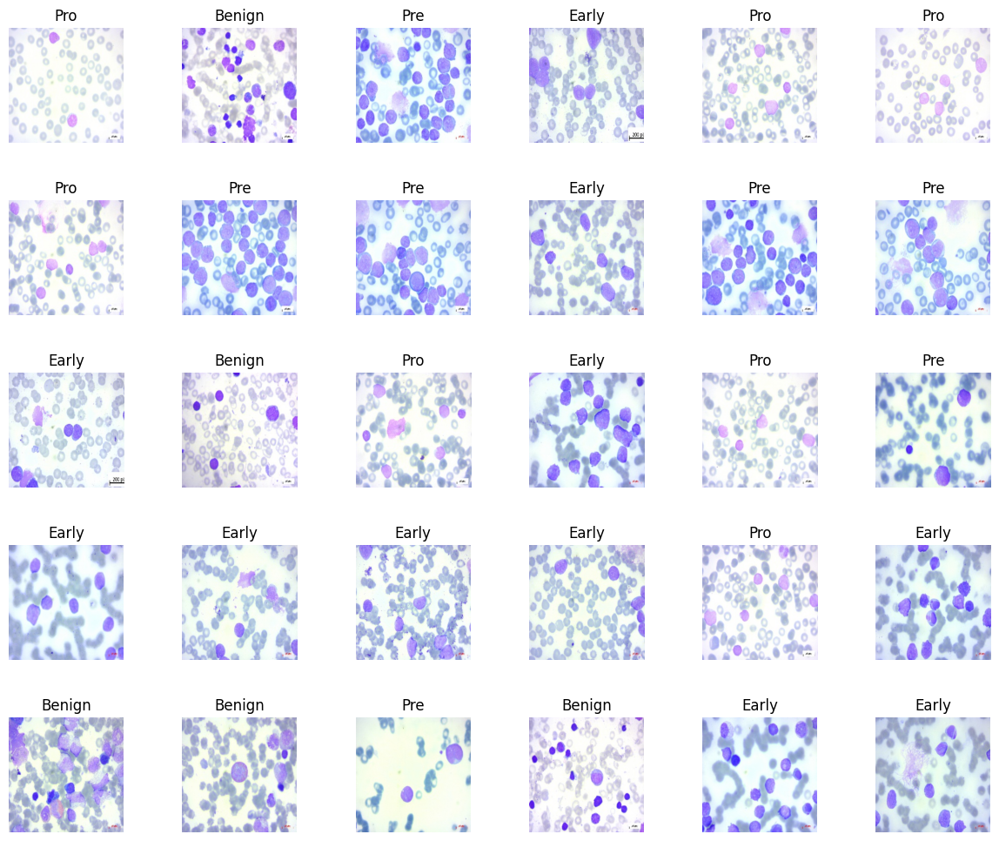

In [22]:
# Initialize a list to store file names from all subfolders
file_names = []

# Iterate over the subfolders and get the file names
for subfolder in os.listdir(original_directory_path):
    subfolder_path = os.path.join(original_directory_path, subfolder)
    if os.path.isdir(subfolder_path):
        file_names.extend(os.listdir(subfolder_path))

# Make sure there are at least 30 images available
if len(file_names) >= 30:
    # Randomly select 30 images from the list
    example_images = sample(file_names, 30)

    # Set up the figure layout
    rows, columns = 5, 6
    figure, axes = plt.subplots(rows, columns, figsize=(15, 12))
    figure.subplots_adjust(hspace=0.5)

    # Iterate over the example images and display them in the grid
    for i, file_name in enumerate(example_images):
        # Iterate over the subfolders to find the image
        for subfolder in os.listdir(original_directory_path):
            subfolder_path = os.path.join(original_directory_path, subfolder)
            image_path = os.path.join(subfolder_path, file_name)
            
            if os.path.isfile(image_path):
                image = cv.imread(image_path)
                image = cv.cvtColor(image, cv.COLOR_BGR2RGB)  # Convert from BGR to RGB for display with matplotlib
                axes[i // columns, i % columns].imshow(image)
                axes[i // columns, i % columns].axis('off')
                axes[i // columns, i % columns].set_title(subfolder)
                break  # Break the loop once the image is found

    plt.show()
else:
    print("There are not enough images in the subfolders to display 30 examples.")


In [23]:
data = [os.path.join(folder, file) for folder in os.listdir(original_directory_path) for file in os.listdir(os.path.join(original_directory_path, folder))]
labels = [folder for folder in os.listdir(original_directory_path) for file in os.listdir(os.path.join(original_directory_path, folder))]


In [24]:
# train-test split
data_temp,data_test, labels_temp,labels_test = train_test_split(data, labels, test_size=0.2, random_state=42)
data_train, data_val, labels_train, labels_val = train_test_split(data_temp, labels_temp, test_size=0.1, random_state=42)



datagen = ImageDataGenerator(rescale=1./255,  # rescale pixel a [0,1]
                             rotation_range=40,
                             width_shift_range=0.2,
                             height_shift_range=0.2,
                             shear_range=0.2,
                             zoom_range=0.2,
                             horizontal_flip=True,
                             fill_mode='nearest')

train_generator = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': data_train, 'label': labels_train}),
    directory=original_directory_path,
    x_col='filename',
    y_col='label',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'  
)

val_generator = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': data_val, 'label': labels_val}),
    directory=original_directory_path,
    x_col='filename',
    y_col='label',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
)


test_datagen = ImageDataGenerator(rescale=1./255)

test_generator = test_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': data_test, 'label': labels_test}),
    directory=original_directory_path,
    x_col='filename',
    y_col='label',
    target_size=(224,224),
    batch_size=32,
    class_mode='categorical'
)

Found 2343 validated image filenames belonging to 4 classes.
Found 261 validated image filenames belonging to 4 classes.
Found 652 validated image filenames belonging to 4 classes.


In [25]:
parameters = {"dense_units": 4,
              "activation": "relu",
              "batch_size": 32,
              "n_epochs": 50
              }

run["model/parameters"] = parameters

In [26]:
callbacks = [
    EarlyStopping(monitor='val_recall', min_delta=0, patience=8, mode='max'), 
    ModelCheckpoint('best_model2.h5', monitor='val_recall', save_best_only=True),
    NeptuneCallback(run=run)
]

In [27]:
# Define the CNN model
cnn_model = Sequential()  
cnn_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3), padding='same'))  
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Conv2D(64, (3, 3), activation='relu', padding='same')) input image so that the output has the same shape as the input.)
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
cnn_model.add(MaxPooling2D((2, 2)))
cnn_model.add(Flatten())  
cnn_model.add(Dense(128, activation='relu'))  
cnn_model.add(Dropout(0.5))  
cnn_model.add(Dense(4, activation='softmax'))  
cnn_model.compile(optimizer='Adam',
                  loss='categorical_crossentropy',
                  metrics=[tf.keras.metrics.Recall()])


In [27]:
# Create ResNet50 model fine-tuning the whole model
resnet_model = Sequential()
resnet_model.add(ResNet50(include_top=False, weights='imagenet', input_shape=(224, 224, 3)))
resnet_model.add(MaxPooling2D())
resnet_model.add(Flatten()) 
resnet_model.add(Dropout(0.3))
resnet_model.add(Dense(150, activation='relu'))  
resnet_model.add(Dense(4, activation='softmax'))  
resnet_model.compile(optimizer=Adam(learning_rate=0.0001),
                     loss='categorical_crossentropy',
                     metrics=[tf.keras.metrics.Recall()])

# Train both models
history_cnn , history_resnet = train_models(cnn_model , resnet_model, train_generator, val_generator, callbacks)


Epoch 1/50
74/74 [==============================] - 120s 2s/step - loss: 1.2208 - recall_2: 0.2932 - val_loss: 0.8806 - val_recall_2: 0.4559
Epoch 2/50
74/74 [==============================] - 124s 2s/step - loss: 0.7774 - recall_2: 0.5514 - val_loss: 0.5698 - val_recall_2: 0.6475
Epoch 3/50
74/74 [==============================] - 126s 2s/step - loss: 0.5715 - recall_2: 0.7076 - val_loss: 0.4068 - val_recall_2: 0.8199
Epoch 4/50
74/74 [==============================] - 127s 2s/step - loss: 0.6453 - recall_2: 0.6987 - val_loss: 0.6551 - val_recall_2: 0.5249
Epoch 5/50
74/74 [==============================] - 119s 2s/step - loss: 0.6146 - recall_2: 0.6752 - val_loss: 0.4399 - val_recall_2: 0.7969
Epoch 6/50
74/74 [==============================] - 102s 1s/step - loss: 0.4652 - recall_2: 0.7793 - val_loss: 0.3529 - val_recall_2: 0.8352
Epoch 7/50
74/74 [==============================] - 108s 1s/step - loss: 0.4911 - recall_2: 0.7823 - val_loss: 0.3662 - val_recall_2: 0.8582
Epoch 8/50
74

In [28]:
cnn_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_6 (Conv2D)           (None, 224, 224, 32)      896       
                                                                 
 max_pooling2d_6 (MaxPoolin  (None, 112, 112, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_7 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_8 (Conv2D)           (None, 56, 56, 128)       73856     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 28, 28, 128)      

In [29]:
resnet_model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 7, 7, 2048)        23587712  
                                                                 
 max_pooling2d_10 (MaxPooli  (None, 3, 3, 2048)        0         
 ng2D)                                                           
                                                                 
 flatten_4 (Flatten)         (None, 18432)             0         
                                                                 
 dropout_4 (Dropout)         (None, 18432)             0         
                                                                 
 dense_8 (Dense)             (None, 150)               2764950   
                                                                 
 dense_9 (Dense)             (None, 4)                 604       
                                                      

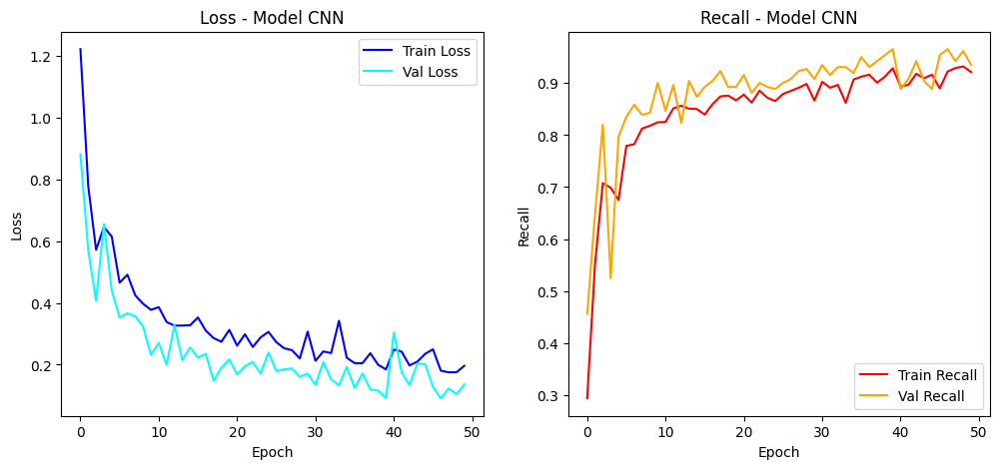

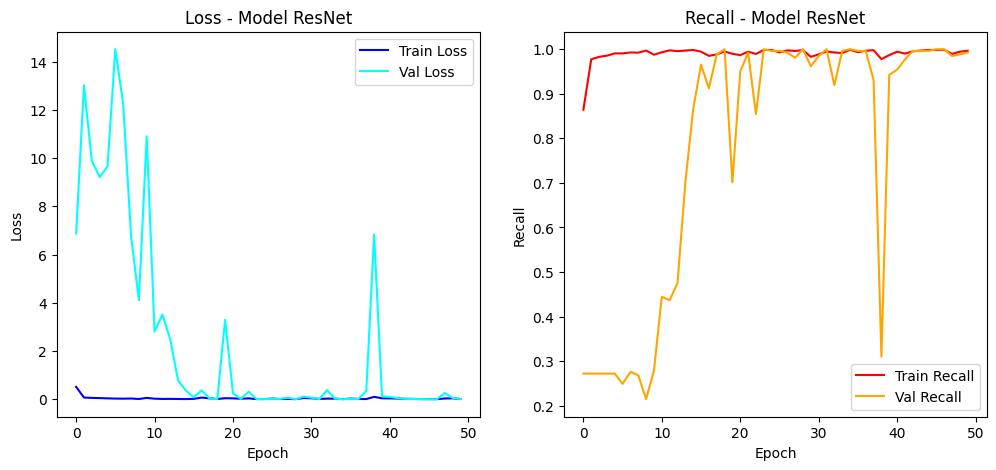

In [32]:
plot_model_history(history_cnn, "Model CNN")

plot_model_history(history_resnet, "Model ResNet")

1/1 [==============================] - 0s 53ms/step


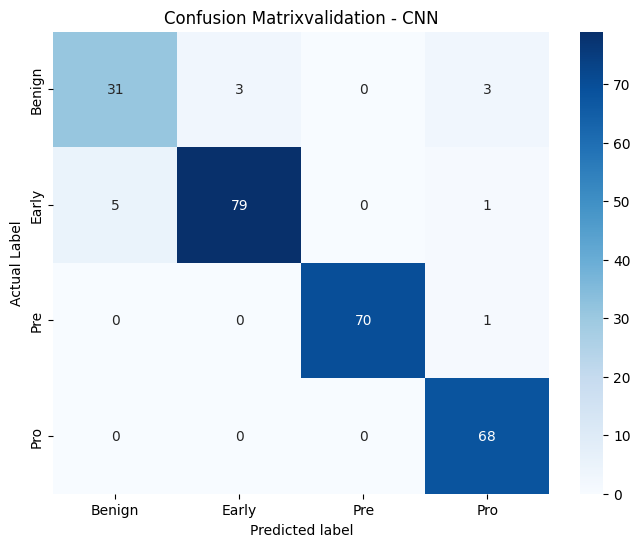

              precision    recall  f1-score   support

      Benign       0.86      0.84      0.85        37
       Early       0.96      0.93      0.95        85
         Pre       1.00      0.99      0.99        71
         Pro       0.93      1.00      0.96        68

    accuracy                           0.95       261
   macro avg       0.94      0.94      0.94       261
weighted avg       0.95      0.95      0.95       261



In [42]:
subcarpetas=["Benign","Early","Pre","Pro"]
y_true_cnn, y_pred_cnn = calcular_matriz(cnn_model, val_generator, 'CNN', 'validation')

1/1 [==============================] - 1s 973ms/step


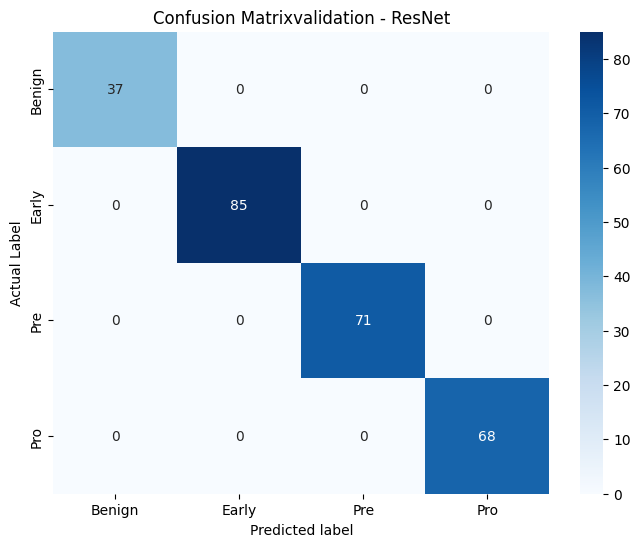

              precision    recall  f1-score   support

      Benign       1.00      1.00      1.00        37
       Early       1.00      1.00      1.00        85
         Pre       1.00      1.00      1.00        71
         Pro       1.00      1.00      1.00        68

    accuracy                           1.00       261
   macro avg       1.00      1.00      1.00       261
weighted avg       1.00      1.00      1.00       261



In [43]:
y_true_resnet, y_pred_resnet = calcular_matriz(resnet_model, val_generator, 'ResNet', 'validation')

In [44]:
test_loss, test_recall = resnet_model.evaluate(test_generator)
print(f'Test recall: {test_recall:.2f}, Test loss: {test_loss:.2f}')

21/21 [==============================] - 36s 2s/step - loss: 0.0112 - recall_4: 0.9954
Test recall: 1.00, Test loss: 0.01


In [45]:
run["evaluation/recall"] = test_recall
run["evaluation/loss"] = test_loss

1/1 [==============================] - 1s 689ms/step


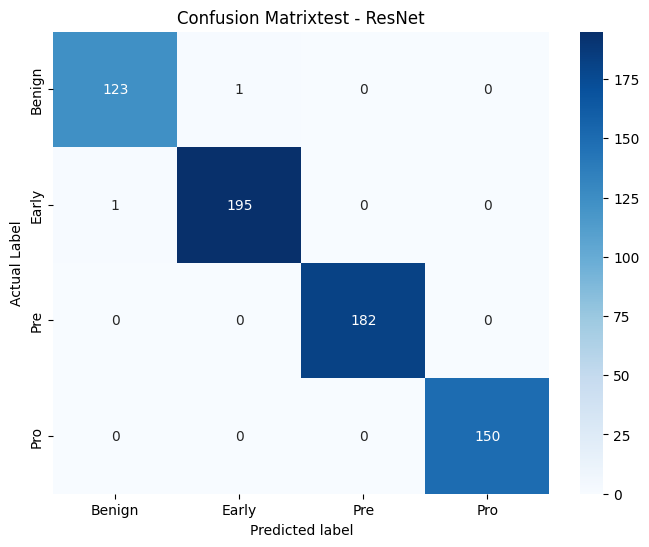

              precision    recall  f1-score   support

      Benign       0.99      0.99      0.99       124
       Early       0.99      0.99      0.99       196
         Pre       1.00      1.00      1.00       182
         Pro       1.00      1.00      1.00       150

    accuracy                           1.00       652
   macro avg       1.00      1.00      1.00       652
weighted avg       1.00      1.00      1.00       652



In [46]:
y_true_resnet_test, y_pred_resnet_test = calcular_matriz(resnet_model, test_generator, 'ResNet', 'test')

21/21 [==============================] - 37s 2s/step


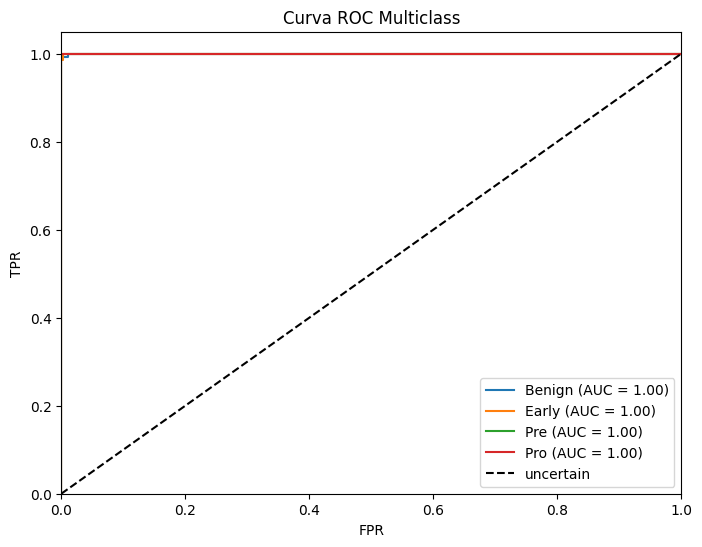

In [47]:
calcular_curva_roc(resnet_model, test_generator, y_true_resnet_test)

In [48]:

explainer = GradCAM()  
index = 5


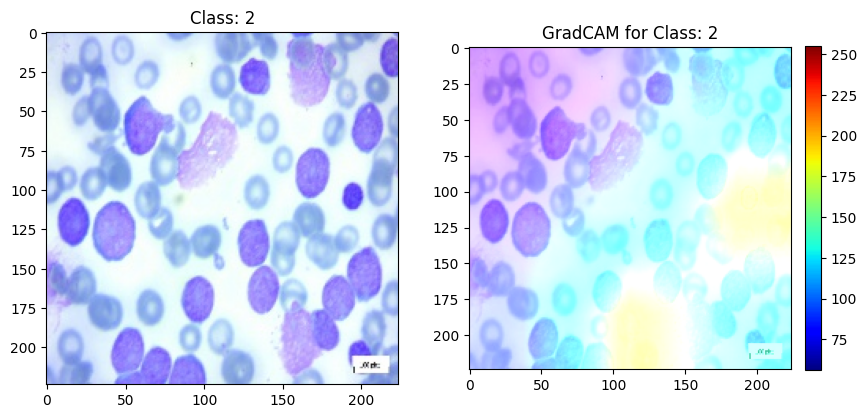

In [50]:

img_index = 3
img = test_generator[index][0][img_index]
label = int(np.argmax(test_generator[index][1][img_index]))
img_to_explain = np.expand_dims(img, 0)
output = explainer.explain(validation_data=[img_to_explain, None], model=resnet_model, class_index=label)

fig, ax = plt.subplots(1, 2, figsize=(10, 5))

ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'Class: {label}')

im = ax[1].imshow(output, cmap='jet')
ax[1].set_title(f'GradCAM for Class: {label}')

cbar = fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)

plt.show()


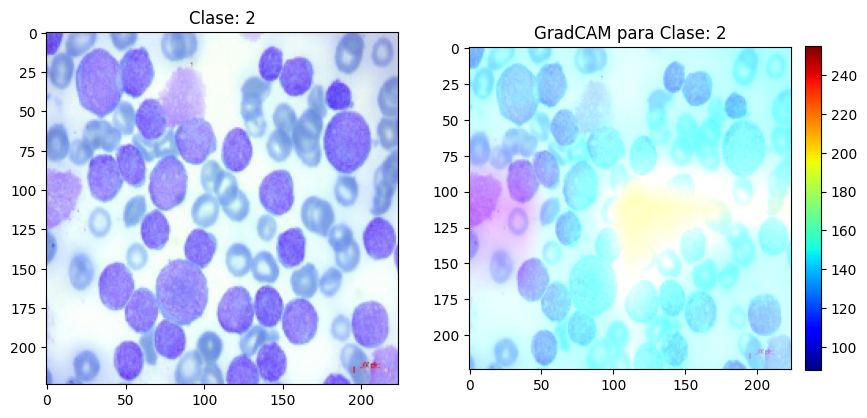

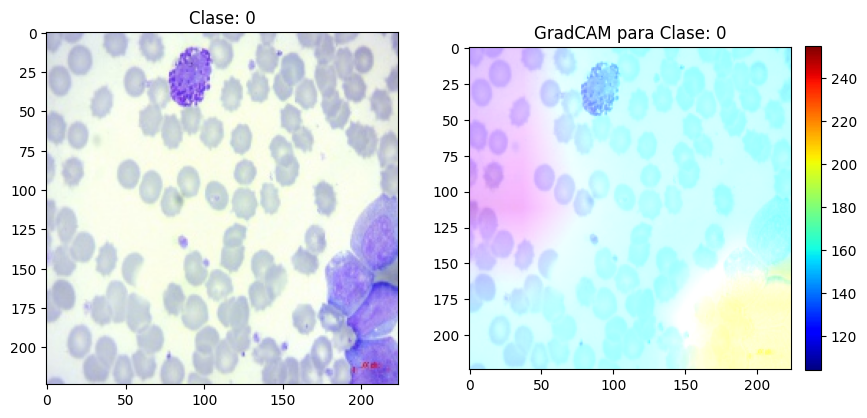

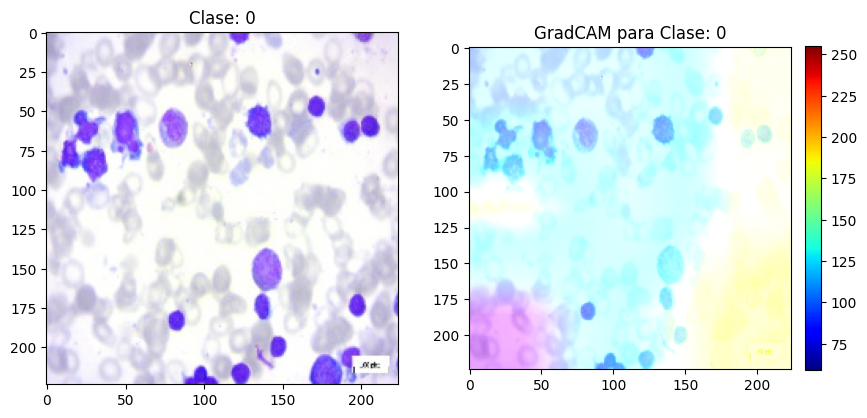

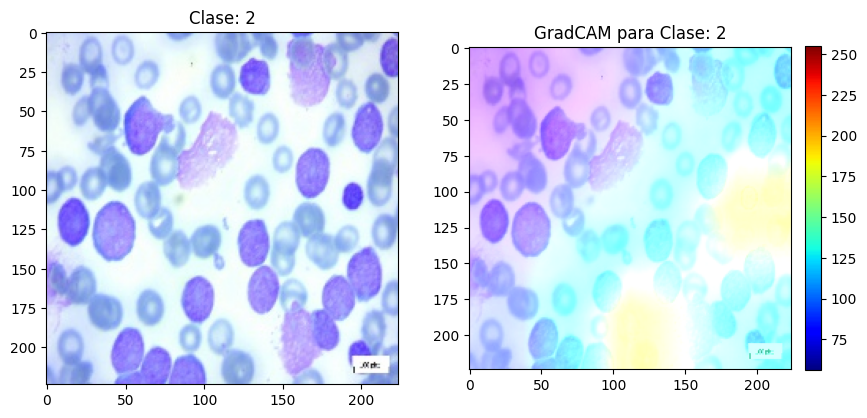

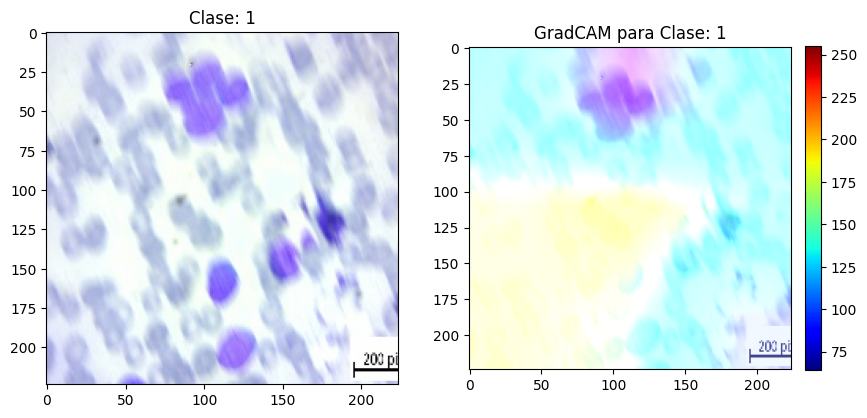

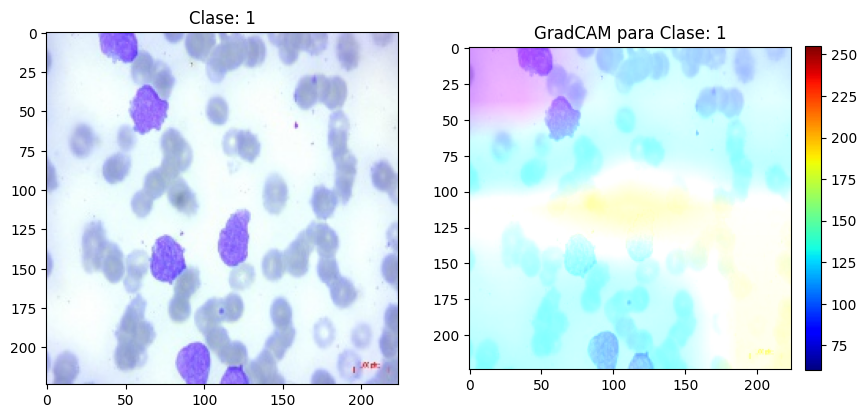

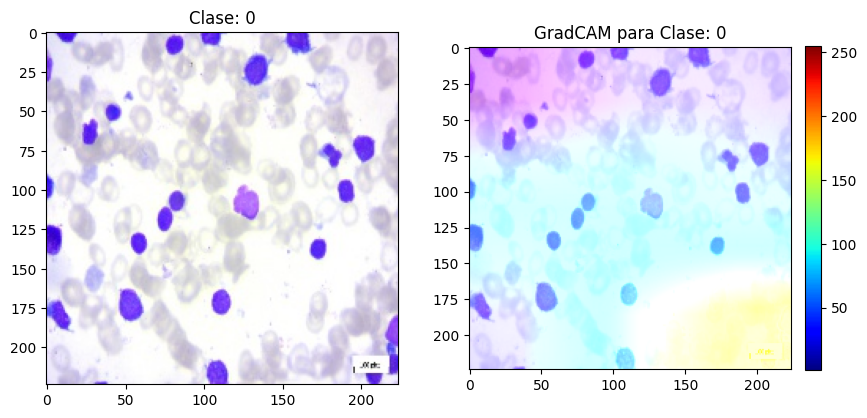

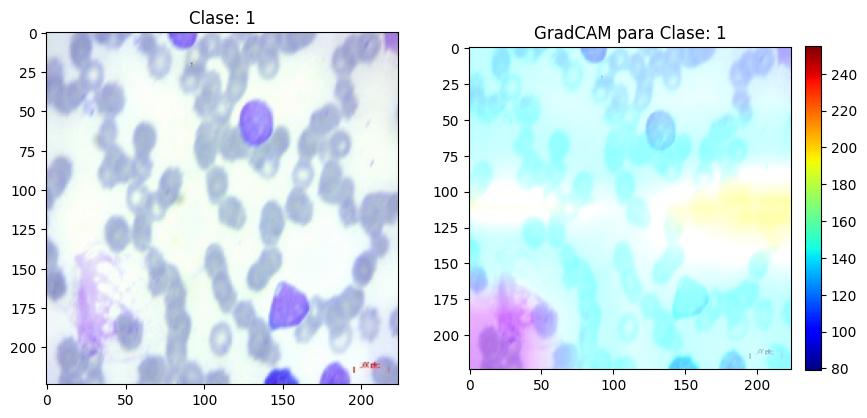

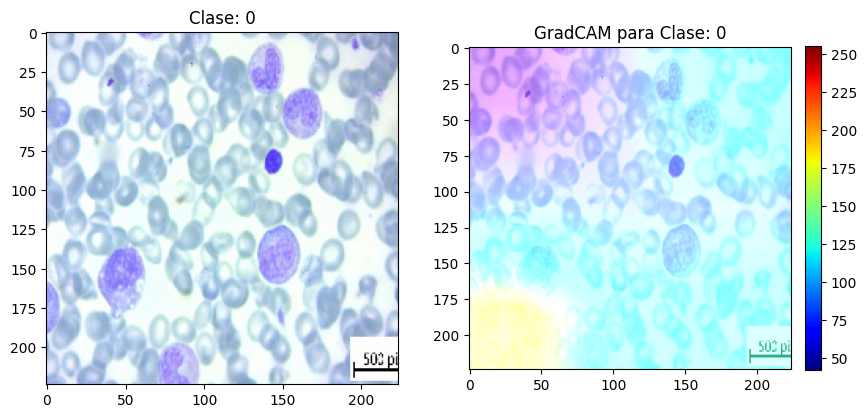

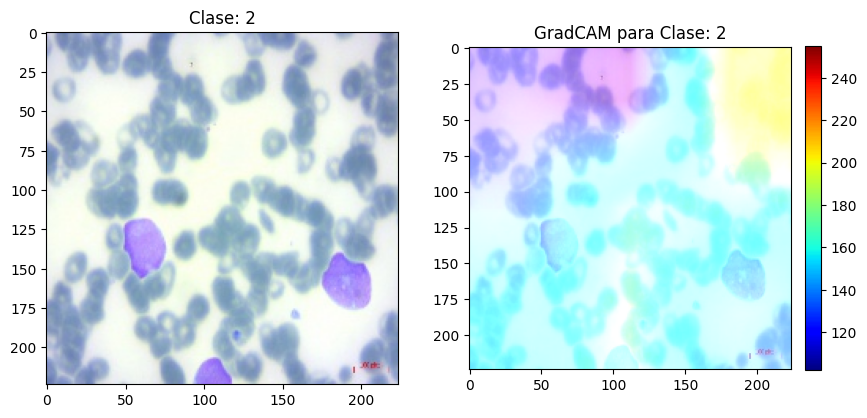

In [51]:
show_grad_cam(5,explainer,test_generator, resnet_model )

In [52]:
categories = set(labels_test) 
category_lists = {category: [] for category in categories}

image_count_per_category = {category: 0 for category in categories}

for data1, label in zip(data_test, labels_test):
    if image_count_per_category[label] < 5:
        category_lists[label].append(data1)
        image_count_per_category[label] += 1


for category, data_list in category_lists.items():
    print(f'{category}: {len(data_list)} elements')


for category, data_list in category_lists.items():
    print(f'{category} - First 5 images:')
    for data1 in data_list:
        print(data1)


Pro: 5 elements
Pre: 5 elements
Early: 5 elements
Benign: 5 elements
Pro - First 5 images:
Pro\WBC-Malignant-Pro-146.jpg
Pro\WBC-Malignant-Pro-216.jpg
Pro\WBC-Malignant-Pro-621.jpg
Pro\WBC-Malignant-Pro-109.jpg
Pro\WBC-Malignant-Pro-016.jpg
Pre - First 5 images:
Pre\WBC-Malignant-Pre-863.jpg
Pre\WBC-Malignant-Pre-810.jpg
Pre\WBC-Malignant-Pre-122.jpg
Pre\WBC-Malignant-Pre-381.jpg
Pre\WBC-Malignant-Pre-272.jpg
Early - First 5 images:
Early\WBC-Malignant-Early-487.jpg
Early\WBC-Malignant-Early-670.jpg
Early\WBC-Malignant-Early-703.jpg
Early\WBC-Malignant-Early-605.jpg
Early\WBC-Malignant-Early-503.jpg
Benign - First 5 images:
Benign\WBC-Benign-135.jpg
Benign\WBC-Benign-479.jpg
Benign\WBC-Benign-333.jpg
Benign\WBC-Benign-323.jpg
Benign\WBC-Benign-140.jpg


(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
(180, 180, 3)
Pro - Resized images without the mark:


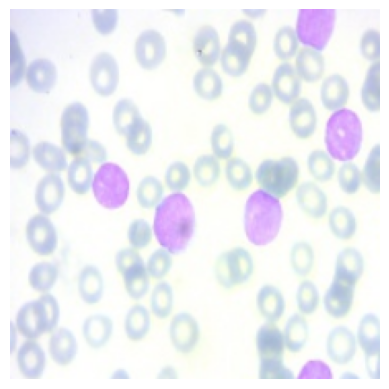

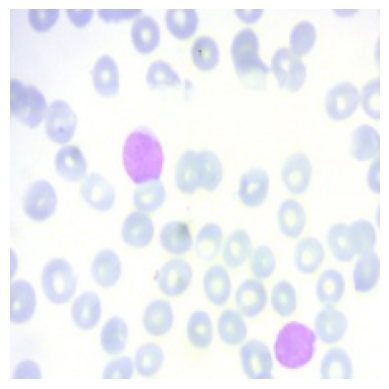

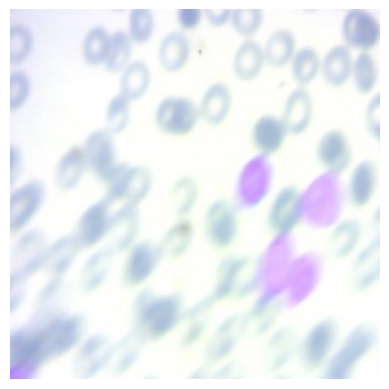

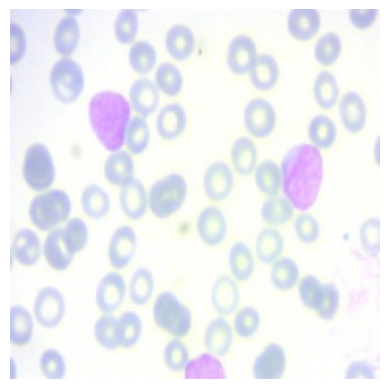

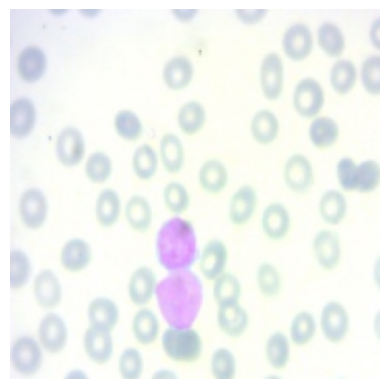

Pre - Resized images without the mark:


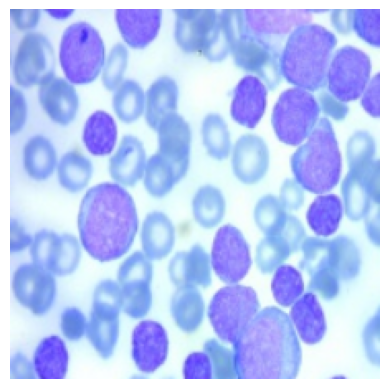

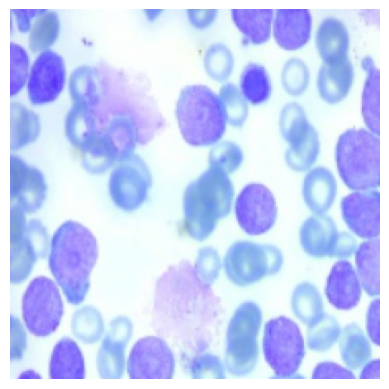

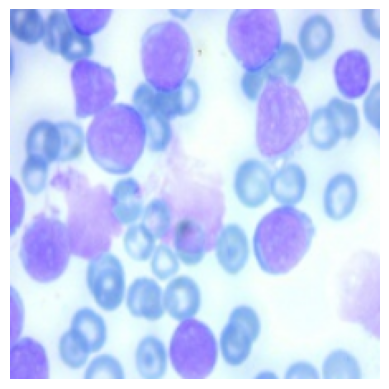

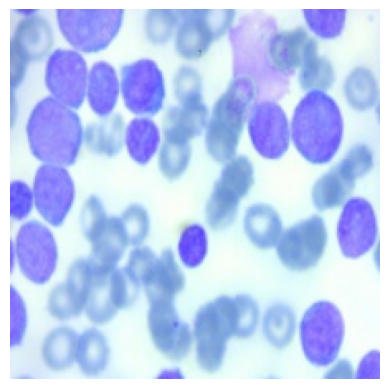

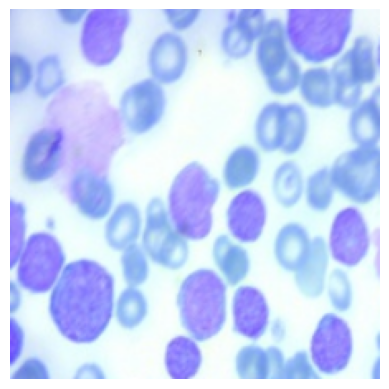

Early - Resized images without the mark:


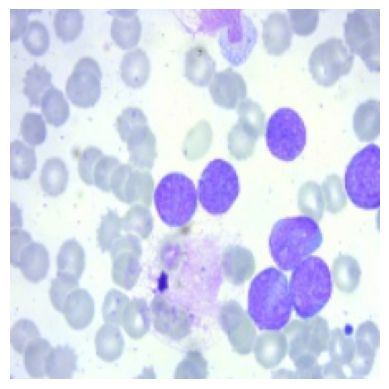

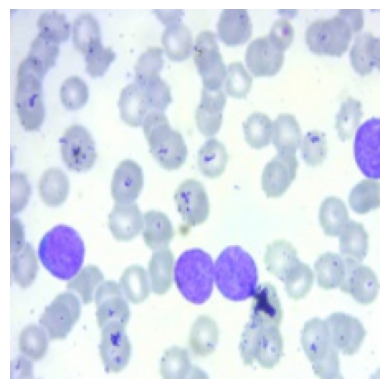

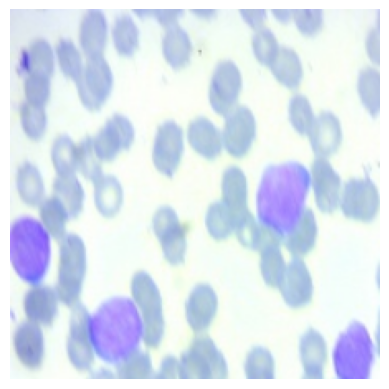

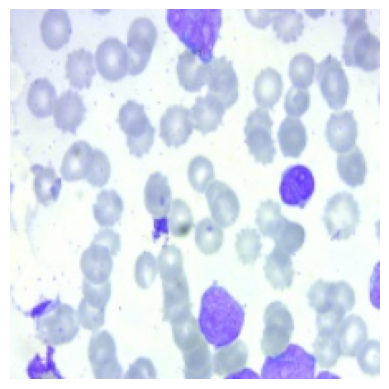

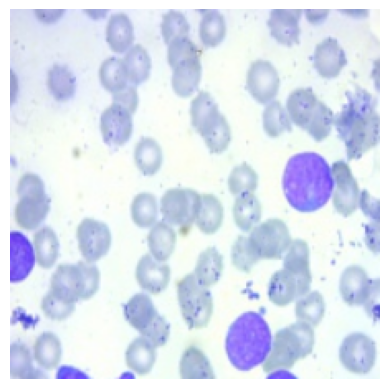

Benign - Resized images without the mark:


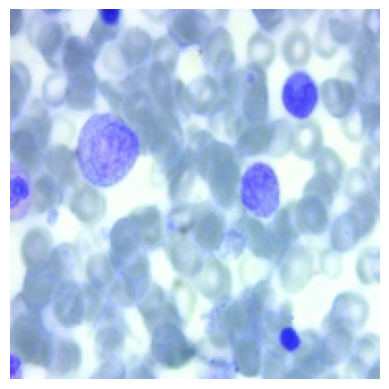

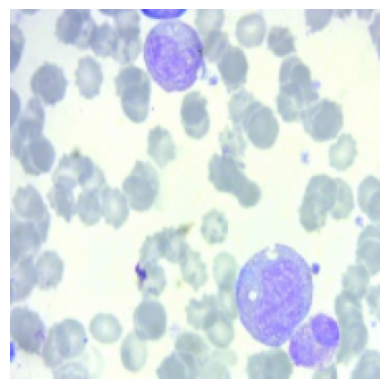

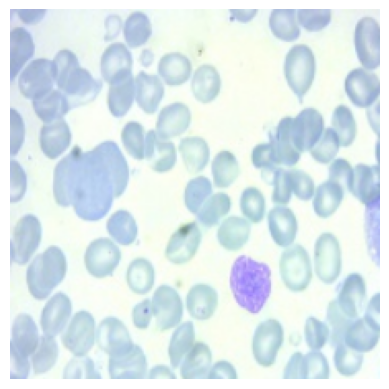

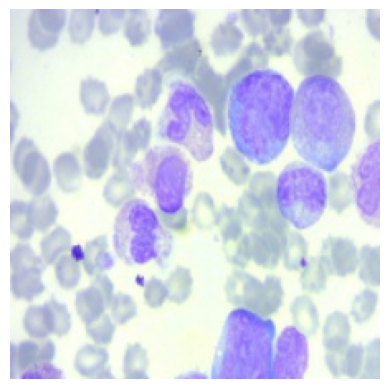

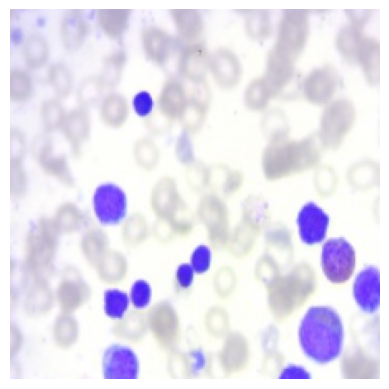

In [53]:

resized_images = {category: [] for category in categories}

def resize_and_remove_mark(image, target_size=(224, 224), target_width=180, mark_height=10): 
    resized_image = image[0:target_width, 0:target_width]
    print(resized_image.shape)
    resized_image = cv.resize(resized_image, target_size)
    return resized_image

for category, data_list in category_lists.items():
    for data in data_list:
        image_path = os.path.join(original_directory_path, data)
        image = cv.imread(image_path)
        if image is not None:
            resized_image = resize_and_remove_mark(image, target_width=180, mark_height=30)  # Adjust these values as needed
            resized_images[category].append(resized_image)

for category, image_list in resized_images.items():
    print(f'{category} - Resized images without the mark:')
    for resized_image in image_list:
        plt.imshow(cv.cvtColor(resized_image, cv.COLOR_BGR2RGB))
        plt.axis('off')
        plt.show()


In [55]:

for category, data_list in resized_images.items():
    for image in data_list:
        
       
        
        if image is not None:
            preprocessed_image = np.expand_dims(image, axis=0).astype(np.float64)
            preprocessed_image = preprocessed_image / 255
            prediction = resnet_model.predict(preprocessed_image)
            print(f'The image {category} was classified as {np.argmax(prediction)}')


1/1 [==============================] - 0s 77ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 78ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 86ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 82ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 91ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 76ms/step
The image Pre was classified as 0
1/1 [==============================] - 0s 90ms/step
The image Pre was classified as 0
1/1 [==============================] - 0s 97ms/step
The image Pre was classified as 0
1/1 [==============================] - 0s 134ms/step
The image Pre was classified as 0
1/1 [==============================] - 0s 101ms/step
The image Pre was classified as 2
1/1 [==============================] - 0s 107ms/step
The image Early was classified as 0
1/1 [==============================] - 0s 92ms/st

In [57]:
def calculate_accuracy(model, dataset, category_mapping):
    total_samples = 0
    correct_predictions = 0

    for category, data_list in dataset.items():
        for image in data_list:
            if image is not None:
                preprocessed_image = np.expand_dims(image, axis=0).astype(np.float64)
                preprocessed_image = preprocessed_image / 255
                prediction = model.predict(preprocessed_image)
                predicted_class = np.argmax(prediction)
                true_class = category_mapping[category]
                if predicted_class == true_class:
                    correct_predictions += 1
                total_samples += 1

    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy

category_mapping = {'Benign': 0, 'Early': 1, 'Pre': 2, 'Pro': 3}

accuracy = calculate_accuracy(resnet_model, resized_images, category_mapping)
print(f'Accuracy: {accuracy * 100:.2f}%')


1/1 [==============================] - 0s 103ms/step
Accuracy: 55.00%


1/1 [==============================] - 0s 84ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 80ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 85ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 73ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 86ms/step
The image Pro was classified as 3
1/1 [==============================] - 0s 89ms/step
The image Pre was classified as 2
1/1 [==============================] - 0s 84ms/step
The image Pre was classified as 2
1/1 [==============================] - 0s 93ms/step
The image Pre was classified as 2
1/1 [==============================] - 0s 76ms/step
The image Pre was classified as 2
1/1 [==============================] - 0s 84ms/step
The image Pre was classified as 2
1/1 [==============================] - 0s 83ms/step
The image Early was classified as 1
1/1 [==============================] - 0s 87ms/step


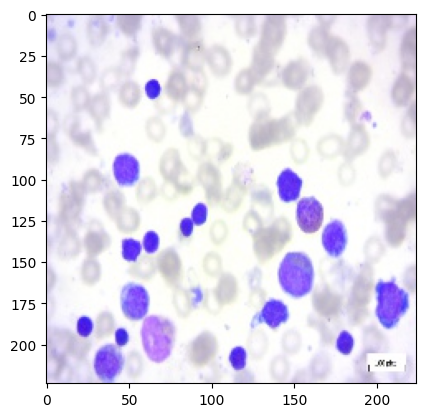

In [59]:

for category, data_list in category_lists.items():
    for data in data_list:
        image_path = os.path.join(original_directory_path, data)
        image = cv.imread(image_path)
        image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
        plt.imshow(image)  
        if image is not None:
            preprocessed_image = np.expand_dims(image, axis=0).astype(np.float64)
            preprocessed_image /= 255
            prediction = resnet_model.predict(preprocessed_image)
            print(f'The image {category} was classified as {np.argmax(prediction)}')


In [61]:
def calculate_accuracy_from_original(model, category_lists, original_directory_path, category_mapping):
    total_samples = 0
    correct_predictions = 0

    for category, data_list in category_lists.items():
        for data in data_list:
            image_path = os.path.join(original_directory_path, data)
            image = cv.imread(image_path)
            image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
            if image is not None:
                preprocessed_image = np.expand_dims(image, axis=0).astype(np.float64)
                preprocessed_image /= 255
                prediction = model.predict(preprocessed_image)
                predicted_class = np.argmax(prediction)
                true_class = category_mapping[category]
                if predicted_class == true_class:
                    correct_predictions += 1

                total_samples += 1

    # Calculate the accuracy
    accuracy = correct_predictions / total_samples if total_samples > 0 else 0
    return accuracy

category_mapping = {'Benign': 0, 'Early': 1, 'Pre': 2, 'Pro': 3}
accuracy = calculate_accuracy_from_original(resnet_model, category_lists, original_directory_path, category_mapping)
print(f'Accuracy: {accuracy * 100:.2f}%')


1/1 [==============================] - 0s 98ms/step
Accuracy: 100.00%


In [62]:

data = [os.path.join(folder, file) for folder in os.listdir(original_directory_path) for file in os.listdir(os.path.join(original_directory_path, folder))]
labels = [folder for folder in os.listdir(original_directory_path) for file in os.listdir(os.path.join(original_directory_path, folder))]


In [63]:
data_temp, data_test, labels_temp, labels_test = train_test_split(data, labels, test_size=0.2, random_state=seed)
data_train, data_val, labels_train, labels_val = train_test_split(data_temp, labels_temp, test_size=0.1, random_state=seed)

datagen = ImageDataGenerator(
    preprocessing_function=crop_upper_corner,  
    rescale=1./255,  
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

train_generator = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': data_train, 'label': labels_train}),
    directory=original_directory_path,
    x_col='filename',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'  
)

val_generator = datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': data_val, 'label': labels_val}),
    directory=original_directory_path,
    x_col='filename',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)

test_datagen = ImageDataGenerator(preprocessing_function=crop_upper_corner, rescale=1./255) # in test, we only crop the images and rescale them without performing data augmentation

test_generator = test_datagen.flow_from_dataframe(
    dataframe=pd.DataFrame({'filename': data_test, 'label': labels_test}),
    directory=original_directory_path,
    x_col='filename',
    y_col='label',
    target_size=(224, 224),
    batch_size=32,
    class_mode='categorical'
)


Found 2343 validated image filenames belonging to 4 classes.
Found 261 validated image filenames belonging to 4 classes.
Found 652 validated image filenames belonging to 4 classes.


(32, 224, 224, 3)


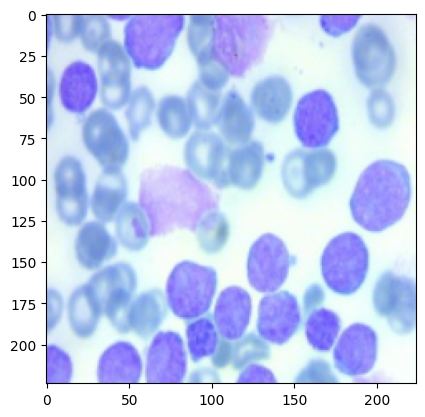

In [64]:
for img, label in test_generator:
    print(img.shape)
    plt.imshow(img[0])
    break

In [1]:
import tensorflow as tf
model_path = 'C:/Users/Ashish/Documents/model5.h5'
loaded_model = tf.keras.models.load_model(model_path)


In [28]:
history_resnet = loaded_model.fit(train_generator,
                                   epochs=50,
                                   validation_data=val_generator,
                                   callbacks=callbacks)


Epoch 1/50
74/74 [==============================] - 679s 9s/step - loss: 0.0067 - recall_4: 0.9983 - val_loss: 0.0034 - val_recall_4: 1.0000
Epoch 2/50
74/74 [==============================] - 665s 9s/step - loss: 0.0324 - recall_4: 0.9923 - val_loss: 1.0085 - val_recall_4: 0.8467
Epoch 3/50
74/74 [==============================] - 660s 9s/step - loss: 0.0051 - recall_4: 0.9983 - val_loss: 0.0191 - val_recall_4: 0.9885
Epoch 4/50
74/74 [==============================] - 663s 9s/step - loss: 0.0200 - recall_4: 0.9949 - val_loss: 0.0396 - val_recall_4: 0.9962
Epoch 5/50
74/74 [==============================] - 661s 9s/step - loss: 0.0363 - recall_4: 0.9919 - val_loss: 12.5630 - val_recall_4: 0.3372
Epoch 6/50
74/74 [==============================] - 662s 9s/step - loss: 0.0120 - recall_4: 0.9957 - val_loss: 0.0672 - val_recall_4: 0.9732
Epoch 7/50
74/74 [==============================] - 667s 9s/step - loss: 0.0142 - recall_4: 0.9932 - val_loss: 0.0236 - val_recall_4: 0.9923
Epoch 8/50
7

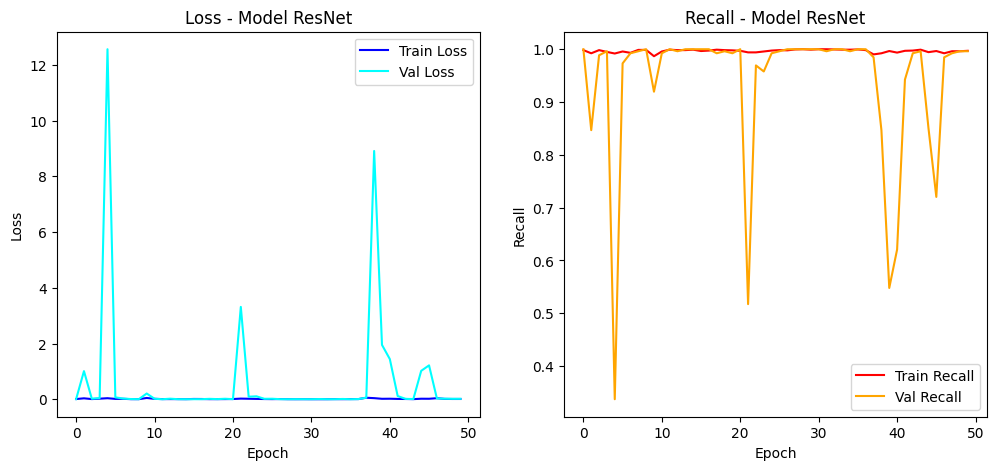

In [30]:
plot_model_history(history_resnet, "Model ResNet")

1/1 [==============================] - 0s 332ms/step


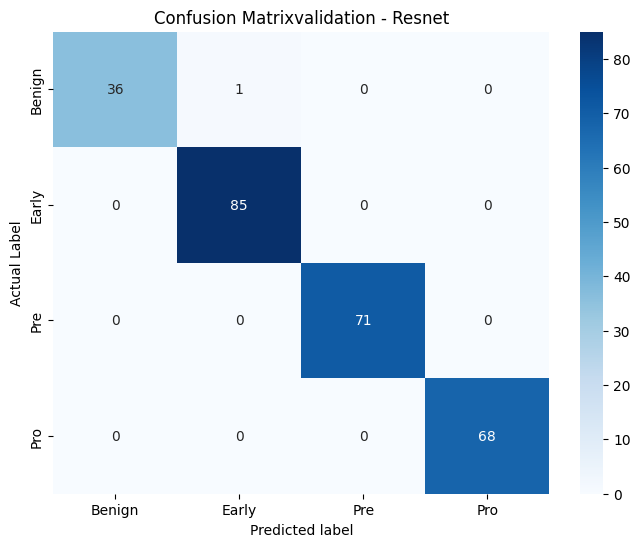

              precision    recall  f1-score   support

      Benign       1.00      0.97      0.99        37
       Early       0.99      1.00      0.99        85
         Pre       1.00      1.00      1.00        71
         Pro       1.00      1.00      1.00        68

    accuracy                           1.00       261
   macro avg       1.00      0.99      1.00       261
weighted avg       1.00      1.00      1.00       261



In [35]:
subcarpetas=["Benign","Early","Pre","Pro"]
y_true_resnet, y_pred_resnet = calcular_matriz(loaded_model, val_generator, 'Resnet', 'validation')

In [37]:
test_loss, test_recall = loaded_model.evaluate(test_generator)
print(f'Test recall: {test_recall:.2f}, Test loss: {test_loss:.2f}')

21/21 [==============================] - 36s 2s/step - loss: 0.0520 - recall_4: 0.9862
Test recall: 0.99, Test loss: 0.05


1/1 [==============================] - 1s 729ms/step


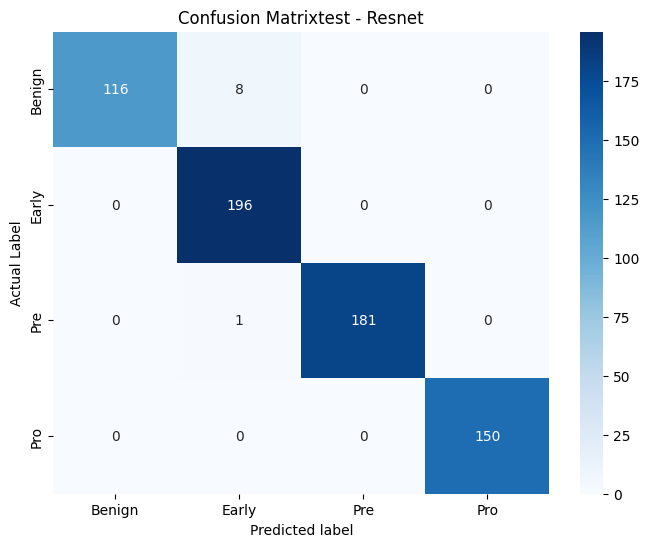

              precision    recall  f1-score   support

      Benign       1.00      0.94      0.97       124
       Early       0.96      1.00      0.98       196
         Pre       1.00      0.99      1.00       182
         Pro       1.00      1.00      1.00       150

    accuracy                           0.99       652
   macro avg       0.99      0.98      0.99       652
weighted avg       0.99      0.99      0.99       652



In [38]:
y_true_resnet_test, y_pred_resnet_test = calcular_matriz(loaded_model, test_generator, 'Resnet', 'test')

21/21 [==============================] - 37s 2s/step


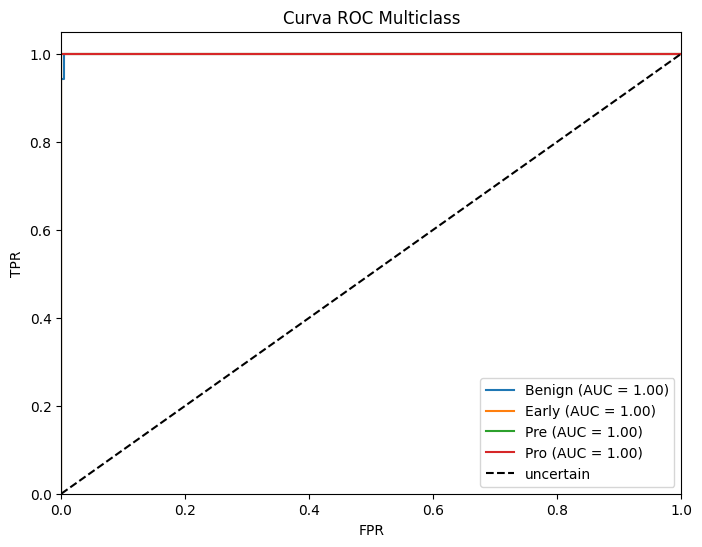

In [39]:
calcular_curva_roc(loaded_model, test_generator, y_true_resnet_test)

In [ ]:
model = loaded_model
file_path = 'C:/Users/Ashish/Documents/model5.h5'
model.save(file_path)

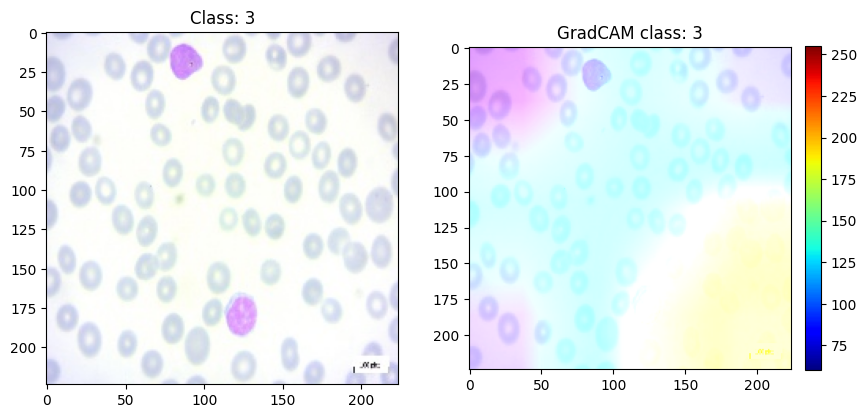

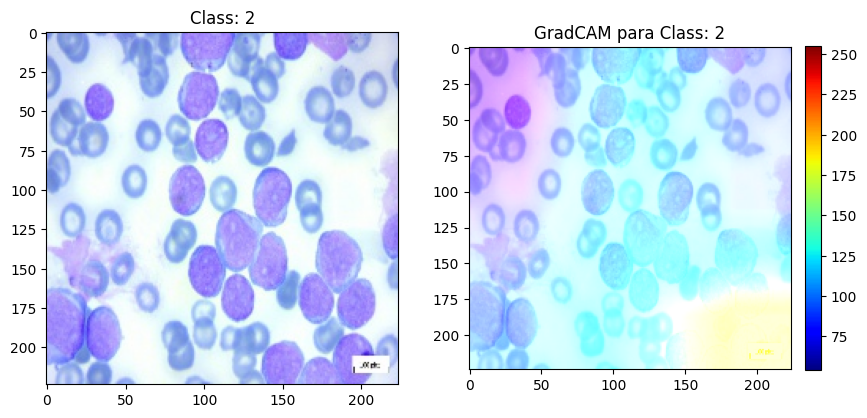

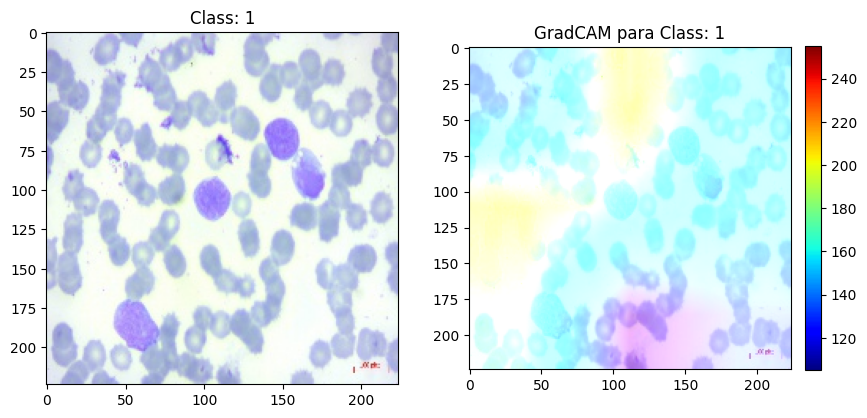

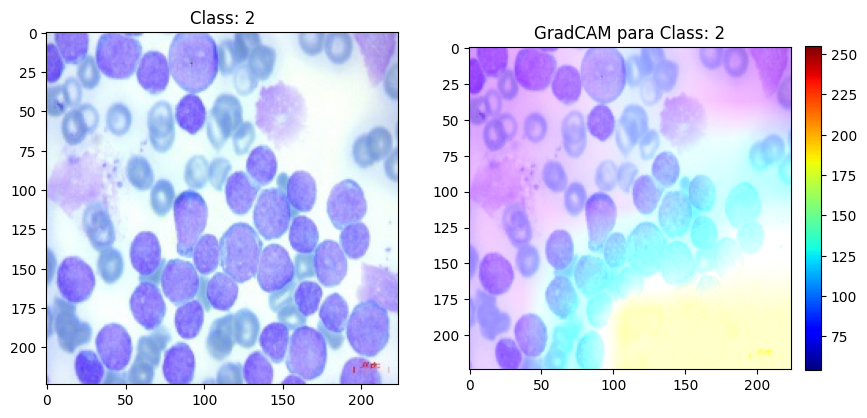

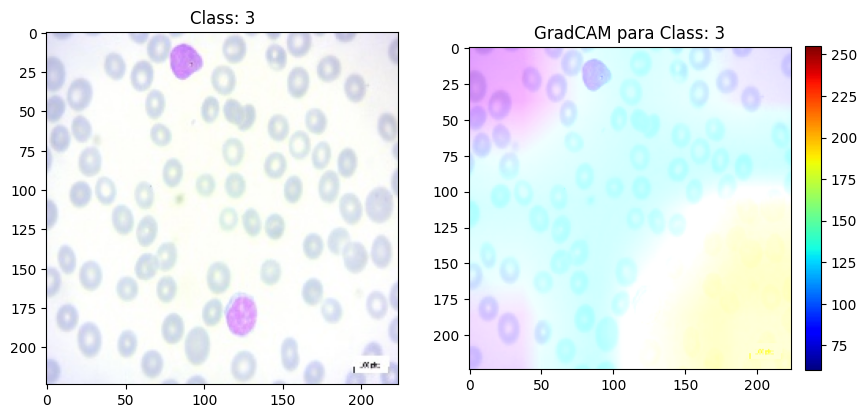

...

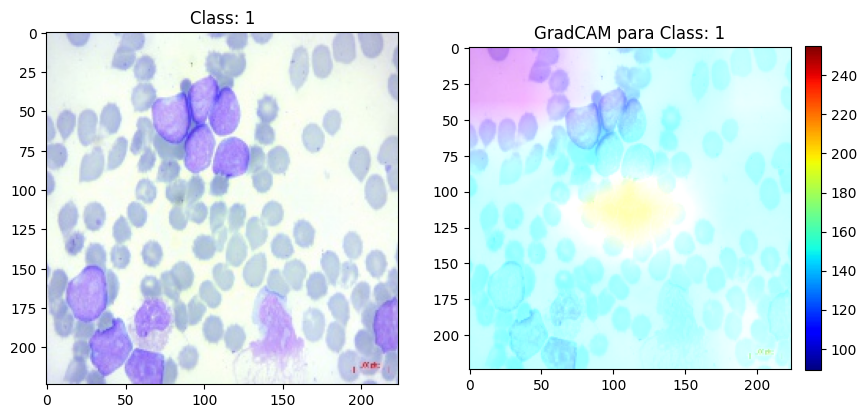

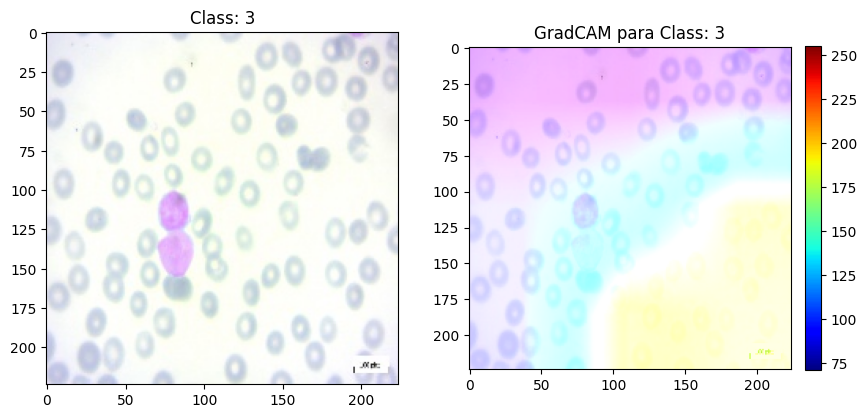

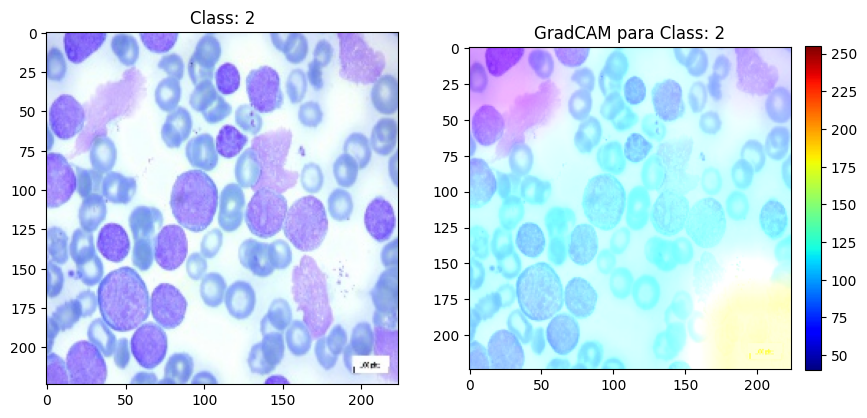

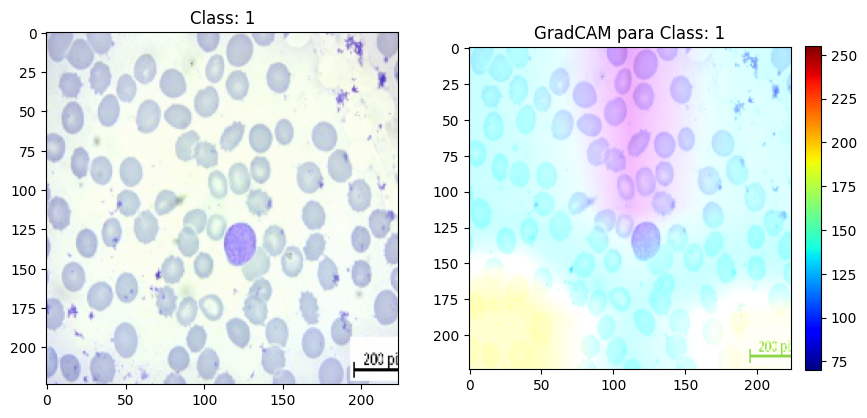

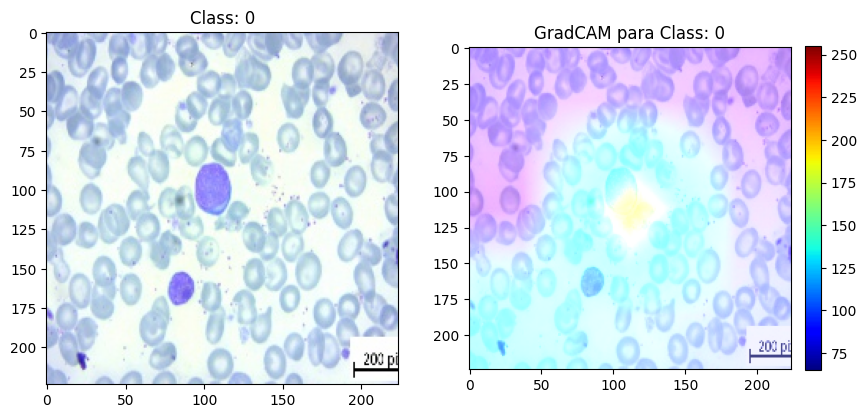

In [50]:

explainer = GradCAM() 
index = 5
img_index = 3
img = test_generator[index][0][img_index]
label = int(np.argmax(test_generator[index][1][img_index]))
img_to_explain = np.expand_dims(img, 0)
output = explainer.explain(validation_data=[img_to_explain, None], model=loaded_model, class_index=label)


fig, ax = plt.subplots(1, 2, figsize=(10, 5))


ax[0].imshow(img, cmap='gray')
ax[0].set_title(f'Class: {label}') 

im = ax[1].imshow(output, cmap='jet')
ax[1].set_title(f'GradCAM class: {label}') 
cbar = fig.colorbar(im, ax=ax[1], fraction=0.046, pad=0.04)
show_grad_cam(5,explainer,test_generator, loaded_model )

In [64]:
import tensorflow as tf

model_path = 'C:/Users/Ashish/Documents/model5.h5'

loaded_model = tf.keras.models.load_model(model_path)
def predict_class(image_path):
    try:
        preprocessed_img = preprocess_image(image_path)
        prediction = model.predict(preprocessed_img)
        predicted_class_index = np.argmax(prediction)
        
        # Map the index to the corresponding class label
        class_labels = ['Class 1', 'Class 2', 'Class 3', 'Class 4']
        predicted_class = class_labels[predicted_class_index]
        
        return predicted_class
    except Exception as e:
        print(f"Error occurred during prediction: {str(e)}")
        return None

image_path = "C:/Users/Ashish/Documents/Leukemia Dataset/Original/Pre/WBC-Malignant-Pre-040.jpg"
predicted_class = predict_class(image_path)
if predicted_class:
    print(predicted_class)
else:
    print("Prediction failed.")


1/1 [==============================] - 0s 16ms/step
Class 2
[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
[neptune] [warning] Experiencing connection interruptions. Will try to reestablish communication with Neptune. Internal exception was: RequestsFutureAdapterConnectionError
[neptune] [info   ] Communication with Neptune restored!
[neptune] [info   ] Communication with Neptune restored!
